# Voyager 1 - Peak Scans

Breakthrough Listen observed the Voyager 1 space probe using the Green Bank
Telescope (GBT) during GBT session AGBT22B_999_41 on 2023-04-20/21.  Scans 0112
to 0115 were "Peak" scans that panned the telescope over Voyager's position in
both increasing and decreasing directions of right ascension and declination.

The goal is to fit the power of the Voyager carrier to the Gaussian beam shape
of the telescope to verify the position of Voyager (to within the GBT's pointing
accuracy).  This is similar to, but arguably opposite from, how the GBT's
"AutoPeak" process is used to measure unknown pointing corrections from a radio
source with a precisely known position.  Here we assume the GBT points
precisely and we seek to determine how far Voyager 1 is from the position
predicted by the JPL HORIZONS system.

Another difference from the AutoPeak process is that Voyager is a very
narrow-band signal unlike the broadband calibrators used for AutoPeak.  In order
to even detect Voyager we have to channelize the data to a high frequency
resolution and use only the frequency channels that contain the Voyager carrier,
which drifts in frequency over time due to the relative acceleration between the
GBT and Voyager.  Fortunately this step has already been done, so the zoomed in
data are readily available.

This notebook uses the Julia language to perform this analysis.

## GBT FITS Files

To find the telescope location during these scans we will read the so called
"GBT data" FITS files in which the GBT records metadata about the telescope's
state during each scan.  These FITS files are arranged in a directory tree
rooted in a directory named after the session.  The `ScanLog.fits` file in that
directory is the master index into all the other FITS files recorded during the
session.

Here we read `ScanLog.fits` into a `DataFrame` (similar to Python's `pandas`):

In [1]:
using FITSIO, DataFrames

GBTDATA = "/mnt_gbtdata"
session = "AGBT22B_999_41"

scanlog = FITS(joinpath(GBTDATA, session, "ScanLog.fits"))["ScanLog"] |> DataFrame

Row,DATE-OBS,SCAN,FILEPATH
,String,Int32,String
1,2023-04-20T21:24:16,1,./AGBT22B_999_41/Antenna/2023_04_20_21:24:16.fits
2,2023-04-20T21:24:16,1,./AGBT22B_999_41/LO1A/2023_04_20_21:24:16.fits
3,2023-04-20T21:24:16,1,./AGBT22B_999_41/DCR/2023_04_20_21:24:16.fits
4,2023-04-20T21:24:16,1,./AGBT22B_999_41/Rcvr8_10/2022_12_09_00:00:00.fits
5,2023-04-20T21:24:16,1,./AGBT22B_999_41/ActiveSurfaceMgr/2023_04_20_21:24:16.fits
6,2023-04-20T21:24:16,1,./AGBT22B_999_41/QuadrantDetector/2023_04_20_21:24:16.fits
7,2023-04-20T21:24:16,1,./AGBT22B_999_41/IF/2023_04_20_21:24:16.fits
8,2023-04-20T21:24:16,1,./AGBT22B_999_41/GO/2023_04_20_21:24:16.fits
9,2023-04-20T21:24:16,1,SCAN STARTING AT 60054 21:24:15


We can see that this file/table has 10 entries per scan, 8 of which contain
relative paths to scan and subsystem specific FITS files and 2 scan start/finish
entries.  We are interested in the `Antenna` related FITS files for scans 112
through 115, so let's extract that subset from `scanlog`:

In [2]:
antlog = subset(scanlog, :SCAN=>ByRow(in(112:115)), :FILEPATH=>ByRow(contains("Antenna")))

Row,DATE-OBS,SCAN,FILEPATH
,String,Int32,String
1,2023-04-21T05:07:52,112,./AGBT22B_999_41/Antenna/2023_04_21_05:07:52.fits
2,2023-04-21T05:10:08,113,./AGBT22B_999_41/Antenna/2023_04_21_05:10:08.fits
3,2023-04-21T05:14:18,114,./AGBT22B_999_41/Antenna/2023_04_21_05:14:18.fits
4,2023-04-21T05:16:27,115,./AGBT22B_999_41/Antenna/2023_04_21_05:16:27.fits


Each Antenna FITS file contains a number of data tables.  We are interested in
the one named `ANTPOSGR`, specifically its `DMJD`, `RAJ2000`, and `DECJ2000`
columns.

Let's read in the `ANTPOSGR` tables from these files and select just the columns
of interest:

In [3]:
antpos = map(antlog.FILEPATH) do f
    df = FITS(joinpath(GBTDATA, f))["ANTPOSGR"]|>DataFrame
    select(df, :DMJD, :RAJ2000, :DECJ2000)
end
antpos[1]

Row,DMJD,RAJ2000,DECJ2000
,Float64,Float64,Float64
1,60055.2,258.903,12.3355
2,60055.2,258.903,12.3356
3,60055.2,258.903,12.3357
4,60055.2,258.903,12.3357
5,60055.2,258.903,12.3358
6,60055.2,258.902,12.3358
7,60055.2,258.902,12.3358
8,60055.2,258.902,12.3356
9,60055.2,258.902,12.3355


Now we can plot the RAs and Declinations over time using relative seconds into
each scan:

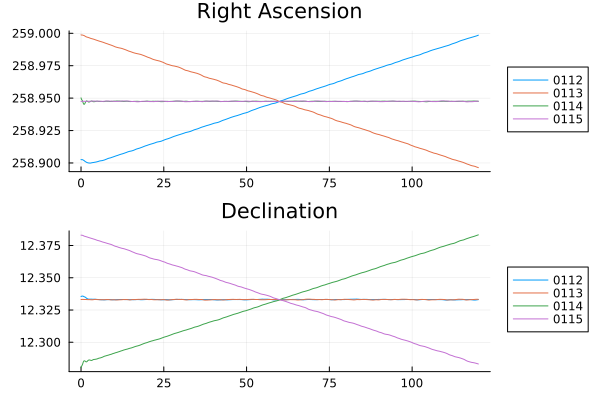

In [4]:
using Plots

# Use mapreduce to extract columns and horizontally concatenate into matrices
# (we can do this because all scans have the same number of entries)
mjds = mapreduce(ap->ap.DMJD, hcat, antpos)
ras = mapreduce(ap->ap.RAJ2000, hcat, antpos)
decs = mapreduce(ap->ap.DECJ2000, hcat, antpos)
# Use permute dims to convert column vector into a row vector
labels = map(s->lpad(s, 4, '0'), antlog.SCAN)|>permutedims

relsecs = (mjds .- mjds[1:1,:]) .* (24*60*60) 
raplot = plot(relsecs, ras; title="Right Ascension", labels, legend=:outerright)
decplot = plot(relsecs, decs; title="Declination", labels, legend=:outerright)

plot(raplot, decplot, layout=(2,1))

We can see that 112 was the increasing RA scan, 113 was the decreasing RA scan,
114 was the increasing declination scan, and 115 was the decreasing declination
scan.  We can also see a slight bit of settling time at the start of each scan.

## Voyager Data

The Breakthrough Listen back end records GBT X-band data on 32 computers (aka
*nodes*), each getting 187.5 MHz of bandwidth.  The entire Voyager signal is
much narrower than this (~45 kHz) and the carrier is even narrower (in theory
just a pure tone).  Over time however, the carrier (and the rest of the Voyager
signal) drifts slightly in frequency due to the acceleration between the GBT
and Voyager as the Earth rotates about its axis and revolves around the sun (and
some small contribution from Voyager's barycentric acceleration).  This somewhat
increases the frequency range we need to work with.

For session AGBT22B_999_41, Voyager's signal was captured by the computer known
as `blc33`.  The voltage data for the Peak scans have been channelized to ~5.6
Hz resolution and 64 of these fine channels centered around the carrier were
extracted and written out as GUPPI RAW (i.e. voltage) files.  As of this
writing, these files are stored on `blc33` in the
`/datax/dibas/GUPPI/BLP33/davidm` directory.  The next steps will not work
unless this notebook is running on `blc33`.

The first thing we will do is get a list of files for these scans by knowing
that the files end with `NNNN.0000.raw`, where `NNNN` is the four digit scan
number.

In [5]:
using Glob

RAWDIR = "/datax/dibas/AGBT22B_999_41/GUPPI/BLP33/davidm"
rawnames = sort(glob("*011[2-5].0000.raw", RAWDIR))

4-element Vector{String}:
 "/datax/dibas/AGBT22B_999_41/GUP" ⋯ 47 bytes ⋯ "1_DIAG_C7_F165430_0112.0000.raw"
 "/datax/dibas/AGBT22B_999_41/GUP" ⋯ 47 bytes ⋯ "1_DIAG_C7_F165443_0113.0000.raw"
 "/datax/dibas/AGBT22B_999_41/GUP" ⋯ 47 bytes ⋯ "1_DIAG_C7_F165468_0114.0000.raw"
 "/datax/dibas/AGBT22B_999_41/GUP" ⋯ 47 bytes ⋯ "1_DIAG_C7_F165481_0115.0000.raw"

We will use the `Blio` package to read these GUPPI RAW files.  Unlike typical
GUPPI RAW files which contain upwards of 100+ header/block units, these files
each contain just a single header/block unit for the entire scan.

In [6]:
using Blio

hdrs112, blks112 = GuppiRaw.load(rawnames[1], DataFrame)
hdrs113, blks113 = GuppiRaw.load(rawnames[2], DataFrame)
hdrs114, blks114 = GuppiRaw.load(rawnames[3], DataFrame)
hdrs115, blks115 = GuppiRaw.load(rawnames[4], DataFrame)

# Show summary of first (and only) block of scan 112
summary(blks112[1])

"2×670×64 Array{Complex{Int8}, 3}"

The data blocks of these files are three dimensional (polarization, time,
channel) and contain `Complex{Int8}` data.  Each block has 2 polarizations, 670
time samples, and 64 frequency channels.  This is voltage data.  To convert to
power we can use the `abs2` function, but we have to be careful about the data
type.  `Int8` has very limited range so conversion to power is likely to
overflow.  We must convert to floating point or a wider integer type to avoid
this problem.  For these relatively small arrays we will just `float` to convert
the `Complex{Int8}` arrays to `Complex{Float64}` arrays before calling `abs2`.

In [7]:
# Convert to floating point
p112 = abs2.(float(blks112[1]))
p113 = abs2.(float(blks113[1]))
p114 = abs2.(float(blks114[1]))
p115 = abs2.(float(blks115[1]))

# Show summary of p112
summary(p112)

"2×670×64 Array{Float64, 3}"

The `heatmap` function can be used to show waterfall plots of power for each
polarization on scan 112.  Not to get too detailed, but here we use heatmap in a
*generator* expression to call it once per polarization.  Then we *splat* them
(using `...`) as arguments to the `plot` function along with the `layout=(1,2)`
keyword argument to produce the side-by-side subplots.

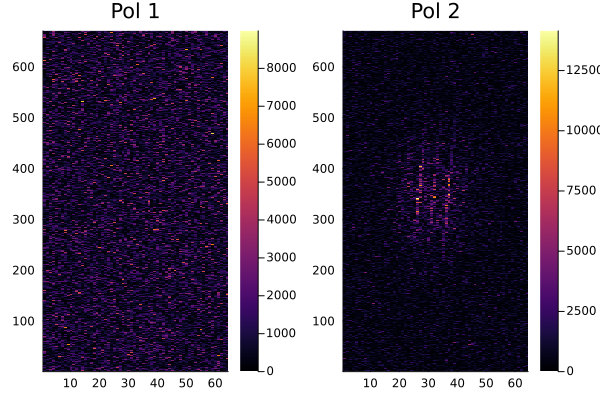

In [8]:
plot((heatmap(p112[p,:,:], title="Pol $p") for p in 1:2)..., layout=(1,2))

The "Pol 1" plot shows nothing but noise whereas the carrier is clearly visible
(for part of the time) in the "Pol 2" plot.  Note that the data from this
session shows three "copies" of the carrier instead of the expected single
carrier tone.  The reason for this is not known, but the total power over time
is still usable for our purposes here.  Here we use a small helper function to
plot pol 2 for all the scans:

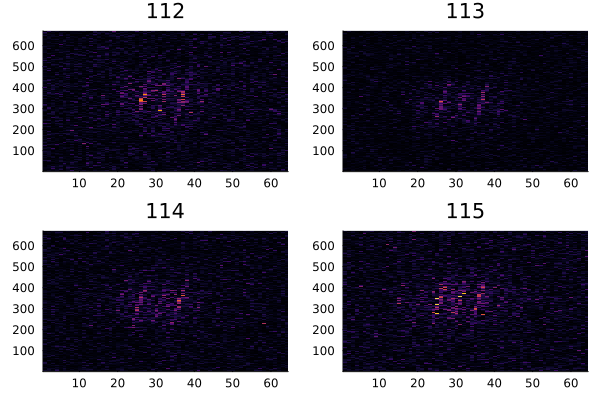

In [9]:
function plotpol2(p, title="Pol 2")
    heatmap(p[2,:,:]; title, legend=false)
end

plot((plotpol2(p,t) for (p,t) in ((p112,112), (p113,113), (p114,114),(p115,115)))..., layout=(2,2))

For all the scans, the carrier power is present only in channels 20 to 40.  We
will use only these channels in our analysis.  Excluding the outer channels
improves will improve peak SNR in total power.  Now we will sum these channels
together to create a total power vector for each scan and (of course) plot them.

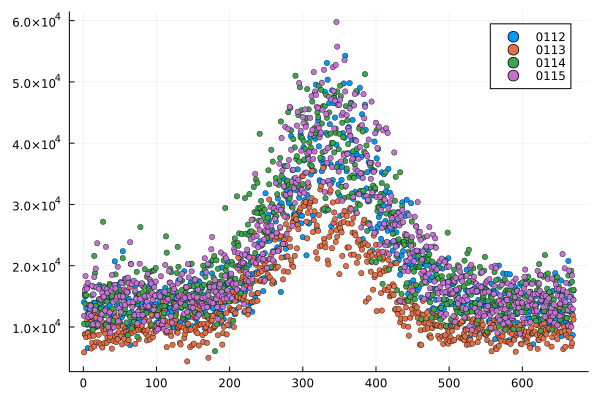

In [10]:
tp112 = dropdims(sum(p112[2,:,20:45], dims=2), dims=2)
tp113 = dropdims(sum(p113[2,:,20:45], dims=2), dims=2)
tp114 = dropdims(sum(p114[2,:,20:45], dims=2), dims=2)
tp115 = dropdims(sum(p115[2,:,20:45], dims=2), dims=2)

scatter([tp112  tp113  tp114  tp115 ];
 labels=["0112" "0113" "0114" "0115"], ms=3, msw=0.5)

### Timestamps

The GBT scans all start on a UTC second boundary.  The date of the scan as an
integer MJD is available in the `STT_IMJD` GUPPI RAW header.  The second in the
day (0-86399) is available in the `STT_SMJD` header.  The duration of each time
sample (and spacing between time samples) in seconds is given by the `TBIN`
header value.  Let's define functions `tstart`, `tsamp`, and `trange` to make
it easy to get the timestamps for each time sample.

- `tstart` returns the timestamp of the first time sample as a `Float64` MJD
  value.  Using `Float64` for timestamps results in approximately millisecond
  precision which is more the precise enough for our needs.  Note that the
  timestamp of the first time sample is actually halfway through the duration of
  the time sample (i.e. half a time sample duration from the start of the scan).
- `tsamp` return the duration of a single time sample (and the spacing between
  time samples).  This is just the `TBIN` header value.
- `trange` returns a `Range` starting at `tstart` with a step size of `tsamp`
  and has as many values as there are in a single data block.

Because we have requested the headers of the GUPPI RAW files to be returned as a
`DataFrame`, we use just the first row when extracting the relevant header
fields.  We also specify the type of the header parameter as `DataFrame` to
prevent this method from being called with a `GuppiRaw.Header` object emphasize,
but since we aren't using those here this more serves as a reminder that these
methods work with a header in a `DataFrame`.

In [11]:
function tstart(h::DataFrame)
    h[1, :stt_imjd] + (h[1, :stt_smjd] + tsamp(h)/2)/(24*60*60)
end

function tsamp(h::DataFrame)
    h[1, :tbin]
end

function trange(h::DataFrame)
    range(tstart(h), step=tsamp(h)/(24*60*60), length=GuppiRaw.getntime(h[1,:]))
end;

## Interpolating Telescope Position

We saw earlier that the GBT Antenna FITS files have MJD timestamped right
ascension and declination values.  We also have a way to get the MJD timestamps
of the time samples in the GUPPI RAW data files.  Unfortunately, the
timestamps for the telescope's position values and the timestamps for the GUPPI
RAW data do not correspond one to one so we must *interpolate* to get the
telescope position for the timestamps in the GUPPI RAW files.  Fortunately, the
`Interpolations.jl` package makes it easy to do this.

Passing vectors of MJD timestamps and corresponding position values from the GBT
Antenna FITS files to `linear_interpolation` returns a callable interpolator
that we can broadcast over the range of MJD timestamps from a GUPPI RAW files to
get the telescope position corresponding to each GUPPI RAW time sample.  This
allows us to plot total power as a function of right ascension (scans 112 and
113) or declination (scans 114 and 115).

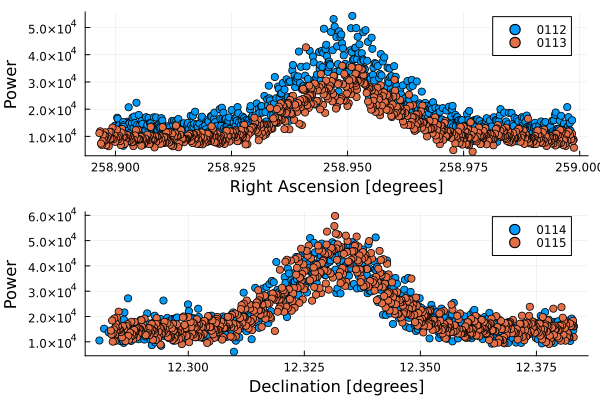

In [12]:
using Interpolations

# Time ranges (tr) of time samples in each scan
tr112 = trange(hdrs112)
tr113 = trange(hdrs113)
tr114 = trange(hdrs114)
tr115 = trange(hdrs115)

# We only care about RA for scans (112,113) and declination for scans (114,115)
ra112  = linear_interpolation(mjds[:,1],  ras[:,1]).(tr112)
ra113  = linear_interpolation(mjds[:,2],  ras[:,2]).(tr113)
dec114 = linear_interpolation(mjds[:,3], decs[:,3]).(tr114)
dec115 = linear_interpolation(mjds[:,4], decs[:,4]).(tr115)

plot(
    scatter([ra112 ra113], [tp112 tp113], labels=["0112" "0113"],
             xlabel="Right Ascension [degrees]", ylabel="Power"),
    scatter([dec114 dec115], [tp114 tp115], labels=["0114" "0115"],
             xlabel="Declination [degrees]", ylabel="Power"),
    layout=(2,1)
)

## Gaussian Fitting

Our next step is to fit a Gaussian PDF beam shape to these data points.  We will
actually fit a Gaussian PDF plus a "baseline" to account for the fact that these
outlier points are not centered around 0.  To account for any slight change in
system gain, we will allow our baseline to have some slope.  This means that our
beam fitting model will have the following five parameters:

- `m` - slope of the baseline
- `b` - y intersect of the baseline
- `µ` - mean of the Gaussian PDF
- `σ` - standard deviation of the Gaussian PDF
- `a` - amplitude scaling for the Gaussian PDF

### Using LsqFit.jl

`LsqFit.jl` is a package that performs a *least squares fit* of data to
non-linear models such as the one just described above.  To use it we must
provide a *model function* that accepts a vector of independent variables (e.g.
the `x` coordinates of the data being fitted) and a vector of model parameters
as inputs.  The model function must return a vector of dependent values computed
for each independent value using the model parameters.  In our case, the
independent variables are the position values (right ascension or declination)
for each time sample and the vector of model parameters is `[m, b, µ, σ, a]`.

Once you have the model function, you can fit data to it by calling the
`curve_fit` function.  That function takes the model function, the independent
variables, the dependent variables (i.e. the data values being fitted), and a
vector of initial values for the model parameters.  It can be convenient to
create a wrapper function that creates the initial parameter vector from the
input data as shown in the `fit_tp` function defined after the model methods
here:

In [13]:
using LsqFit, Distributions

# Beam model method where x is a single number
function beam_model(x::Number, p)
    m, b, µ, σ, a = p
    σ <= 0 && return NaN
    m * x + b + a * pdf(Normal(µ, σ), x)
end

# Beam model method where x is a vector
function beam_model(x::AbstractVector, p)
    beam_model.(x, Ref(p))
end

function beam_fit(x, y)
    n = length(y)
    p0 = [
        0,          # initial slope
        y[1],       # initial y-intercept
        x[n÷2],     # initial mean
        1,          # initial standard deviation
        maximum(y)  # initial amplitude scaling
    ]
    curve_fit(beam_model, x, y, p0)
end;

Now we can fit our data to this model very easily.  The value returned by
`curve_fit` (and `fit_tp`) is an `LsqFitResult` object.  We can get the best fit
parameters by passing this object to the `coef` function, which will return a
vector of the best fit parameters (in the same order that we used in our model
function and the initial values vector).  We can pass this vector along with the
same `x` values to our model function generate the corresponding `y` values of
the best fit curve (e.g. for plotting).

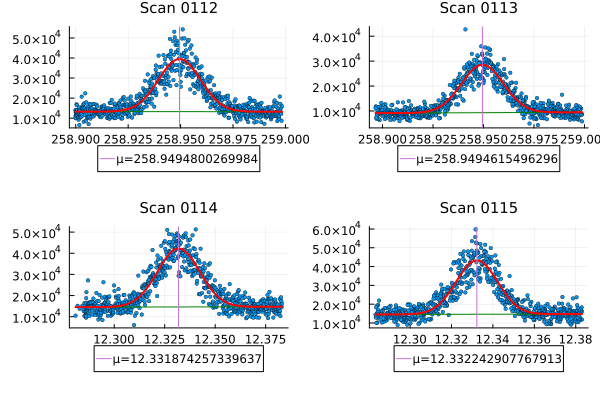

In [14]:
# Tuples of position (xs) and total power (ys) vectors so we can use
# broadcasting instead of explicit loops
xs = (ra112, ra113, dec114, dec115)
ys = (tp112, tp113,  tp114,  tp115)
tp_labels = ("0112", "0113", "0114", "0115")

# lsqfits will be a Tuple of result objects, one per scan
lsqfits = beam_fit.(xs, ys)

# Here is a function that will plot the input data, the fitted Gaussian, the
# fitted "baseline", and a vertical line at the mean/peak of the Gaussian.
function plotfit(x, y, fit, label; kwargs...)
    n = length(y)
    m, b, µ, σ, a = p = coef(fit)
    yfit = beam_model(x, p)
    bl = m .* x .+ b
    scatter(x, y; title="Scan $label", label=nothing, kwargs...)
    plot!(x, bl, label=nothing, lc=:green)
    plot!(x, yfit, label=nothing, lw=2, lc=:red)
    vline!([µ], label="µ=$µ", legend=:outerbottom)
end

plot(plotfit.(xs, ys, lsqfits, tp_labels; ms=2, msw=0.5, titlefontsize=10)..., layout=(2,2))

The fit parameter that we care about most here is `µ`, the mean of the Gaussian,
which is the relevant telescope position (right ascension or declination) when
Voyager was closest to the center of the beam.  We can extract this parameter
from the fit parameters and compare how closely the two RA values are to each
other and how close the two declination values are to each other.

We can also compare the mean of the corresponding values with the JPL HORIZONS
predicted values.  For the predicted right ascension value, we will use the mean
right ascension from scan 115.  Likewise, for the predicted declination value,
we will use the mean declination from scan 113.

In [15]:
using Statistics

voyager_ra_112  = coef(lsqfits[1])[3]
voyager_ra_113  = coef(lsqfits[2])[3]
voyager_dra_112_113_arcsec = (voyager_ra_112 - voyager_ra_113) * (60*60)
voyager_ra_measured = (voyager_ra_112 + voyager_ra_113) / 2
voyager_ra_predict = mean(ras[:, 4])
voyager_dra_measured_predicted = (voyager_ra_measured - voyager_ra_predict) * (60*60)


voyager_dec_predict = mean(decs[:, 2])
voyager_dec_114 = coef(lsqfits[3])[3]
voyager_dec_115 = coef(lsqfits[4])[3]
voyager_ddec_114_115_arcsec = (voyager_dec_114 - voyager_dec_115) * (60*60)
voyager_dec_measured = (voyager_dec_114 + voyager_dec_114) / 2
voyager_ddec_measured_predicted = (voyager_dec_measured - voyager_dec_predict) * (60*60)

[
    :voyager_ra_112                => voyager_ra_112,
    :voyager_ra_113                => voyager_ra_113,
    :voyager_dra_112_113_arcsec    => voyager_dra_112_113_arcsec,
    :voyager_dec_114               => voyager_dec_114,
    :voyager_dec_115               => voyager_dec_115,
    :voyager_ddec_114_115_arcsec   => voyager_ddec_114_115_arcsec,
    :voyager_ra_measured           => voyager_ra_measured,
    :voyager_ra_predict            => voyager_ra_predict,
    :voyager_dec_measured          => voyager_dec_measured,
    :voyager_dec_predict           => voyager_dec_predict,
    :voyager_dra_meas_pred_arcsec  => voyager_dra_measured_predicted,
    :voyager_dra_meas_pred_arcsec_cosv => voyager_dra_measured_predicted * cosd(voyager_dec_measured),
    :voyager_ddec_meas_pred_arcsec => voyager_ddec_measured_predicted
]

13-element Vector{Pair{Symbol, Float64}}:
                    :voyager_ra_112 => 258.9494800269984
                    :voyager_ra_113 => 258.9494615496296
        :voyager_dra_112_113_arcsec => 0.06651852777395106
                   :voyager_dec_114 => 12.331874257339637
                   :voyager_dec_115 => 12.332242907767913
       :voyager_ddec_114_115_arcsec => -1.3271415417953847
               :voyager_ra_measured => 258.949470788314
                :voyager_ra_predict => 258.94753153786877
              :voyager_dec_measured => 12.331874257339637
               :voyager_dec_predict => 12.333062780841045
      :voyager_dra_meas_pred_arcsec => 6.981301602786516
 :voyager_dra_meas_pred_arcsec_cosv => 6.820221417677058
     :voyager_ddec_meas_pred_arcsec => -4.278684605070282

## GBT Voyager Peak Scan Pointing Stability

Here we look at GBT's pointing stability while performing the Peak scan on
Voyager.  For RA panning scans, we fit a line to the RA values from the Antenna
FITS files and examine the residuals (likewise for declination panning scans).
For the non-panning axes, we can simply examine the residuals after subtracting
the mean.

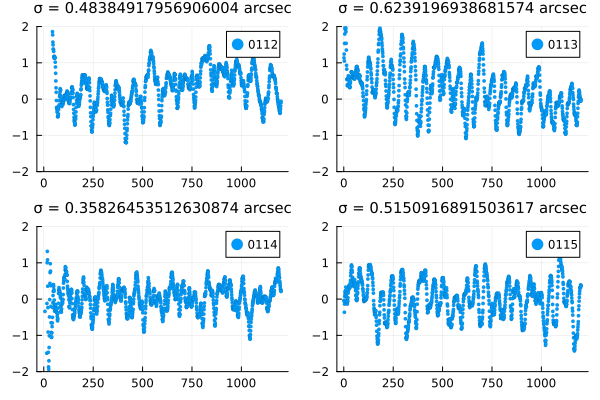

In [16]:
function line_model(x, p)
    m, b = p
    m * x + b
end

function line_model(x::AbstractVector, p)
    line_model.(x, Ref(p))
end

function line_fit(x, y)
    m0 = (y[end] - y[1]) / (x[end] - x[1])
    b0 = y[1] - m0 * x[1]
    curve_fit(line_model, x, y, [m0, b0])
end;

# Line fits for the four scans, skip the first 100 points
skip = 100
lf112 = line_fit(mjds[skip:end,1],  ras[skip:end,1])
lf113 = line_fit(mjds[skip:end,2],  ras[skip:end,2])
lf114 = line_fit(mjds[skip:end,3], decs[skip:end,3])
lf115 = line_fit(mjds[skip:end,4], decs[skip:end,4])

# RA residuals for all the scans
rr112 = ras[:,1] .- line_model(mjds[:,1], coef(lf112))
rr113 = ras[:,2] .- line_model(mjds[:,2], coef(lf113))
rrs = (rr112, rr113, ras[:,3].-mean(ras[:,3]), ras[:,4].-mean(ras[:,4]))

# Dec residuals for all the scans
dr114 = decs[:,3] .- line_model(mjds[:,3], coef(lf114))
dr115 = decs[:,4] .- line_model(mjds[:,4], coef(lf115))
drs = (decs[:,1].-mean(decs[:,1]), decs[:,2].-decs[:,2], dr114, dr115)

# Convert to arcseconds
rrs = map(v->v.*(60*60), rrs)
drs = map(v->v.*(60*60), drs)

plot((scatter(rrs[i], ms=2, msw=0, ylims=(-2,2), legend=:topright,
              title="σ = $(std(rrs[i][skip:end])) arcsec", titlefontsize=10,
              label=tp_labels[i]
             ) for i in eachindex(rrs)
     )..., layout=(2,2)
)

This shows that the GBT was pointing more precisely than the difference between
the measured and predicted position of Voyager.  What this does not verify is
whether the precise pointing was actually in the location that the telescope
claimed to be pointing.

## Calibrator Peak Scans

Scans 0108 to 0111 were peak scans on a radio calibrator, J1728_1215, that is
close to Voyager's position.  These scans can be used to check how well the
telescope pointed at that source to get a sense of how well the telescope was
pointing when observing Voyager.  We'll follow much the same steps, except that
we'll get power data from the high time resolution spectroscopy product (i.e.
the `0001.h5` product) rather than the highly channelized voltage data.

### The Antenna FITS file data

Here we get the timestamped RA and declination values for scans 108 to 111:

In [17]:
callog = subset(scanlog, :SCAN=>ByRow(in(108:111)), :FILEPATH=>ByRow(contains("Antenna")))

calantpos = map(callog.FILEPATH) do f
    df = FITS(joinpath(GBTDATA, f))["ANTPOSGR"]|>DataFrame
    select(df, :DMJD, :RAJ2000, :DECJ2000)
end

# Use mapreduce to extract columns and horizontally concatenate into matrices
# (we can do this because all scans have the same number of entries)
calmjds = mapreduce(ap->ap.DMJD, hcat, calantpos)
calras = mapreduce(ap->ap.RAJ2000, hcat, calantpos)
caldecs = mapreduce(ap->ap.DECJ2000, hcat, calantpos);

### The calibrator power data

Here we read in the time and power data from the HDF5 files:

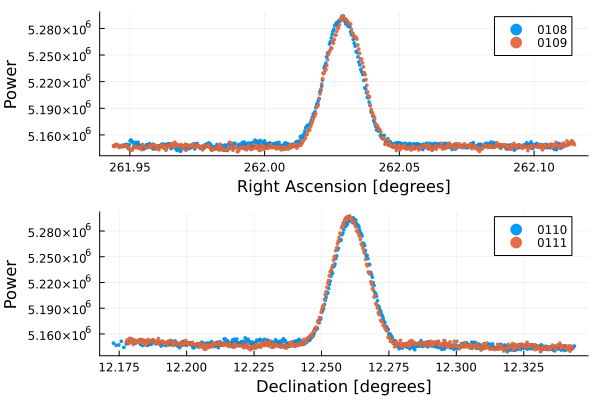

In [21]:
using HDF5, H5Zbitshuffle

H5DIR = "/datax/dibas/AGBT22B_999_41/GUPPI/BLP33"
h5names = [glob("*_0$(scan).*.0001.h5", H5DIR)[1] for scan in 108:111]
h5s = h5open.(h5names)

# Get total powers
caltps = map(h5s) do h5
    # Sum all channels and every 128 time samples together
    dropdims(sum(reshape(h5["data"][], 512, 128, :) , dims=(1,2)), dims=(1,2))
end

# Get time ranges
caltrs = map(h5s) do h5
    t0 = h5["data"]["tstart"][]
    dt = h5["data"]["tsamp"][] ./ (24*60*60)
    nt = size(h5["data"], 3)
    # Downsample by 128
    range(t0+(2*128-1)*dt/2, step=128*dt, length=nt÷128)
end

# We only care about RA for scans (108,109) and declination for scans (110,111)
ra108  = linear_interpolation(calmjds[:,1],  calras[:,1]).(caltrs[1])
ra109  = linear_interpolation(calmjds[:,2],  calras[:,2]).(caltrs[2])
dec110 = linear_interpolation(calmjds[:,3], caldecs[:,3]).(caltrs[3])
dec111 = linear_interpolation(calmjds[:,4], caldecs[:,4]).(caltrs[4])

#plot(scatter.(caltps, ms=2, msw=0)..., layout=(4,1))

plt108 = scatter(ra108, caltps[1], label="0108", ms=2, msw=0,
                 xlabel="Right Ascension [degrees]", ylabel="Power")
scatter!(plt108, ra109, caltps[2], label="0109", ms=2, msw=0)

plt110 = scatter(dec110, caltps[3], label="0110", ms=2, msw=0,
                 xlabel="Declination [degrees]", ylabel="Power")
scatter!(plt110, dec111, caltps[4], label="0111", ms=2, msw=0)

plot(plt108, plt110, layout=(2,1))


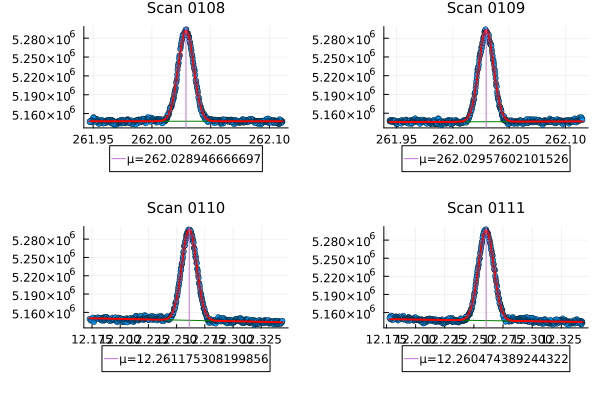

In [37]:
# Tuples of position (xs) and total power (ys) vectors so we can use
# broadcasting instead of explicit loops
calxs = (ra108, ra109, dec110, dec111)
calys = caltps
cal_labels = ("0108", "0109", "0110", "0111")

# lsqfits will be a Tuple of result objects, one per scan
cal_lsqfits = beam_fit.(calxs, calys)

plot(plotfit.(calxs, calys, cal_lsqfits, cal_labels; ms=3, msw=0.5, titlefontsize=10)..., layout=(2,2))

In [36]:
cal_ra_108  = coef(cal_lsqfits[1])[3]
cal_ra_109  = coef(cal_lsqfits[2])[3]
cal_dra_108_109_arcsec = (cal_ra_108 - cal_ra_109) * (60*60)
cal_ra_measured = (cal_ra_108 + cal_ra_109) / 2
cal_ra_actual = 262.02938 # RA from GBT `default.cat`
cal_dra_measured_actual = (cal_ra_measured - cal_ra_actual) * (60*60)


cal_dec_110 = coef(cal_lsqfits[3])[3]
cal_dec_111 = coef(cal_lsqfits[4])[3]
cal_ddec_110_111_arcsec = (cal_dec_110 - cal_dec_111) * (60*60)
cal_dec_measured = (cal_dec_110 + cal_dec_110) / 2
cal_dec_actual = 12.260968333333333 # Dec from GBT `default.cat`
cal_ddec_measured_actual = (cal_dec_measured - cal_dec_actual) * (60*60)

[
    :cal_ra_108                      => cal_ra_108,
    :cal_ra_109                      => cal_ra_109,
    :cal_dra_108_109_arcsec          => cal_dra_108_109_arcsec,
    :cal_dec_110                     => cal_dec_110,
    :cal_dec_111                     => cal_dec_111,
    :cal_ddec_110_111_arcsec         => cal_ddec_110_111_arcsec,
    :cal_ra_measured                 => cal_ra_measured,
    :cal_ra_actual                   => cal_ra_actual,
    :cal_dec_measured                => cal_dec_measured,
    :cal_dec_actual                  => cal_dec_actual,
    :cal_dra_meas_actual_arcsec      => cal_dra_measured_actual,
    :cal_dra_meas_actual_arcsec_cosv => cal_dra_measured_actual * cosd(cal_dec_measured),
    :cal_ddec_meas_actual_arcsec     => cal_ddec_measured_actual
]

13-element Vector{Pair{Symbol, Float64}}:
                      :cal_ra_108 => 262.028946666697
                      :cal_ra_109 => 262.02957602101526
          :cal_dra_108_109_arcsec => -2.26567554580015
                     :cal_dec_110 => 12.261175308199856
                     :cal_dec_111 => 12.260474389244322
         :cal_ddec_110_111_arcsec => 2.523308239922528
                 :cal_ra_measured => 262.0292613438561
                   :cal_ra_actual => 262.02938
                :cal_dec_measured => 12.261175308199856
                  :cal_dec_actual => 12.260968333333333
      :cal_dra_meas_actual_arcsec => -0.4271621180805596
 :cal_dra_meas_actual_arcsec_cosv => -0.4174184235070275
     :cal_ddec_meas_actual_arcsec => 0.7451095194859647